In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"

In [2]:
import numpy as np
import torch
import scanpy as sc
import muon as mu
import anndata
import mudata
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns

print(anndata.__version__)
print(mudata.__version__)
print(sc.__version__)
print(torch.__version__)

0.8.0
0.2.1
1.9.2
1.11.0


In [3]:
%load_ext autoreload
%autoreload 2

from src.mvae.model import MVAE
from src.mvae.train import train_mvae
from src.mvae.dataloader import setup_mudata
from src.mvae.diagnostics import plot_embedding, classification_performance
from src.types import TrainParams
from src.model import ModelParams
from src.utils import get_loss_logs


sc.set_figure_params(scanpy=True, fontsize=14, figsize=[5, 5])

In [4]:
# mdata = mu.read('/media/yob/nacho_stuff/prostate_cancer/Integration/MVAE-PoE/OtF-prostate/data/mdata_preprocessed_final_filtered.h5mu')
mdata = mu.read('/media/gambino/students_workdir/anna/OtF-prostate/data/mdata_out_mvae.h5mu')

In [11]:
metadata = mu.read('/media/yob/nacho_stuff/prostate_cancer/Integration/MVAE-PoE/OtF-prostate/data/mdata_metadata.h5mu')
mdata.obs["new_ann"] = metadata.obs["new_ann"]
mdata.mod["msi"].obs["new_ann"] = metadata.obs["new_ann"]
mdata.mod["rna"].obs["new_ann"] = metadata.obs["new_ann"]

In [12]:
# Set human readable names
mdata.obs["tissue_name"] = mdata.obs["tissue"].apply(lambda x: "Cancer" if x == "DLC2" else "Normal")
mdata.obs["cell_type"] = mdata.obs["new_ann"].apply(lambda x: x if "Tumor" in x else x.replace(" ", "\n"))

def sample_transl(x):
    patient = x.split("_")[0]
    status = x.split("_")[1]
    if status == "DLC2":
        return f"{patient}_cancer"
    return f"{patient}\nnormal"

mdata.obs["sample_name"] = mdata.obs["sample"].apply(lambda x: sample_transl(x))

In [13]:
setup_mudata(mdata, batch_key="sample")

16

## Save output of all MVAE models on one mdata object

In [22]:
models = {
    "mvae_beta0.1_gamma0_epoch100": "mvae_beta0.1_gamma0_20230515-181138.pt",
    "mvae_beta0.01_gamma0_epoch100": "mvae_beta0.01_gamma0_20230511-192619.pt",
    "mvae_beta0.001_gamma0_epoch100": "mvae_beta0.001_gamma0_20230515-154622.pt",
    "mvae_beta0.001_gamma0.0001_epoch100": "mvae_beta0.001_gamma0.0001_epoch100_20230518-182230.pt",
    "mvae_beta0.001_gamma0.0003_epoch100": "mvae_beta0.001_gamma0.0003_epoch100_20230519-034213.pt",
    "mvae_beta0.001_gamma0.0005_epoch100": "mvae_beta0.001_gamma0.0005_epoch100_20230519-184435.pt",
#     "mvae_beta0.001_gamma0.0001": "mvae_beta0.001_gamma0.0001_20230505-191910.pt",
#     "mvae_beta0.001_gamma0.0003": "mvae_beta0.001_gamma0.0003_20230505-024100.pt",
#     "mvae_beta0.001_gamma0.0005": "mvae_beta0.001_gamma0.0005_20230505-052921.pt",
#     "mvae_beta0.001_gamma0.01": "mvae_beta0.001_gamma0.01_20230504-183531.pt",
    "mvae_beta0.001_gamma0.0001_delta0.1": "mvae_beta0.001_gamma0.0001_delta0.1_20230507-034159.pt",
    "mvae_beta0.001_gamma0.0001_delta1.0": "mvae_beta0.001_gamma0.0001_delta1.0_20230506-211801.pt",
#     "mvae_beta0.001_gamma0.0003_delta0.1": "mvae_beta0.001_gamma0.0003_delta0.1_20230507-150411.pt",
#     "mvae_beta0.0001_gamma0.0003": "mvae_beta0.0001_gamma0.0003_20230516-021549.pt"
}
model_names = {
    "mvae_beta0.1_gamma0_epoch100": r"MVAE($\beta=0.1$)",
    "mvae_beta0.01_gamma0_epoch100": r"MVAE($\beta=0.01$)",
    "mvae_beta0.001_gamma0_epoch100": r"MVAE($\beta=0.001$)",
    "mvae_beta0.001_gamma0.0001": r"MVAE($\beta=0.001, \gamma=0.0001$)",
    "mvae_beta0.001_gamma0.0001_epoch100": r"MVAE($\beta=0.001, \gamma=0.0001$)",
    "mvae_beta0.001_gamma0.0003_epoch100": r"MVAE($\beta=0.001, \gamma=0.0003$)",
    "mvae_beta0.001_gamma0.0005_epoch100": r"MVAE($\beta=0.001, \gamma=0.0005$)",
    "mvae_beta0.001_gamma0.0001_delta0.1": r"MVAE($\beta=0.001, \gamma=0.0001, \delta=0.1$)",
    "mvae_beta0.001_gamma0.0001_delta1.0": r"MVAE($\beta=0.001, \gamma=0.0001, \delta=1.0$)",
}

train_params = TrainParams(train_size=0.8, n_epochs=100, learning_rate=1e-4, batch_size=128)
model_params = ModelParams(beta=0.001, n_layers=2, z_dim=100, n_hidden=300, use_cuda=True)

In [50]:
torch.set_num_threads(16)

for m, file in models.items():
    print(m)
    model = MVAE(mdata, model_params)
    model.load_state_dict(torch.load(f"vae_params/{file}"))
    from src.mvae.train import to_latent
    poe,rna_p,msi_p,rna_mod,msi_mod,rna_s,msi_s,rna_batch_free,msi_batch_free = to_latent(model, mdata, train_params)
    mdata.obsm[f"{m}_z1_s"] = np.vstack(rna_s)
    mdata.obsm[f"{m}_z2_s"] = np.vstack(msi_s)
    mdata.obsm[f"{m}_z1_p"] = np.vstack(rna_p)
    mdata.obsm[f"{m}_z2_p"] = np.vstack(msi_p)
    mdata.obsm[f"{m}_z1_mod"] = np.vstack(rna_mod)
    mdata.obsm[f"{m}_z2_mod"] = np.vstack(msi_mod)
    mdata.obsm[f"{m}_z1_batch_free"] = np.vstack(rna_batch_free)
    mdata.obsm[f"{m}_z2_batch_free"] = np.vstack(msi_batch_free)
    mdata.obsm[f"{m}_z"] = np.vstack([x.numpy() for x in poe])
    
    for layer in ["z1_s",
            "z2_s",
            "z1_p",
            "z2_p",
            "z1_mod",
            "z2_mod",
            "z1_batch_free",
            "z2_batch_free"]:
        sc.pp.neighbors(
            mdata, n_neighbors=5, use_rep=f"{m}_{layer}", key_added=f"{m}_neigh_{layer}"
        )
        sc.tl.umap(mdata, neighbors_key=f"{m}_neigh_{layer}")
        mdata.obsm[f"X_{m}_{layer}"] = mdata.obsm["X_umap"]
    
    sc.pp.neighbors(mdata, use_rep=f"{m}_z", n_neighbors=30)
    sc.tl.umap(mdata)
    mdata.obsm[f"X_{m}_z"] = mdata.obsm["X_umap"]
    
    mdata.obsp = {}
    for layer in ["z1_s",
            "z2_s",
            "z1_p",
            "z2_p",
            "z1_mod",
            "z2_mod",
            "z1_batch_free",
            "z2_batch_free", "z"]:
        mdata.obsm.pop(f"{m}_{layer}")
    
mdata.write('/media/gambino/students_workdir/anna/OtF-prostate/data/mdata_out_mvae.h5mu')

mvae_beta0.001_gamma0.0005_epoch100


100%|█████████████████████████████████████████| 332/332 [00:32<00:00, 10.14it/s]


## Shared change with beta

/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/

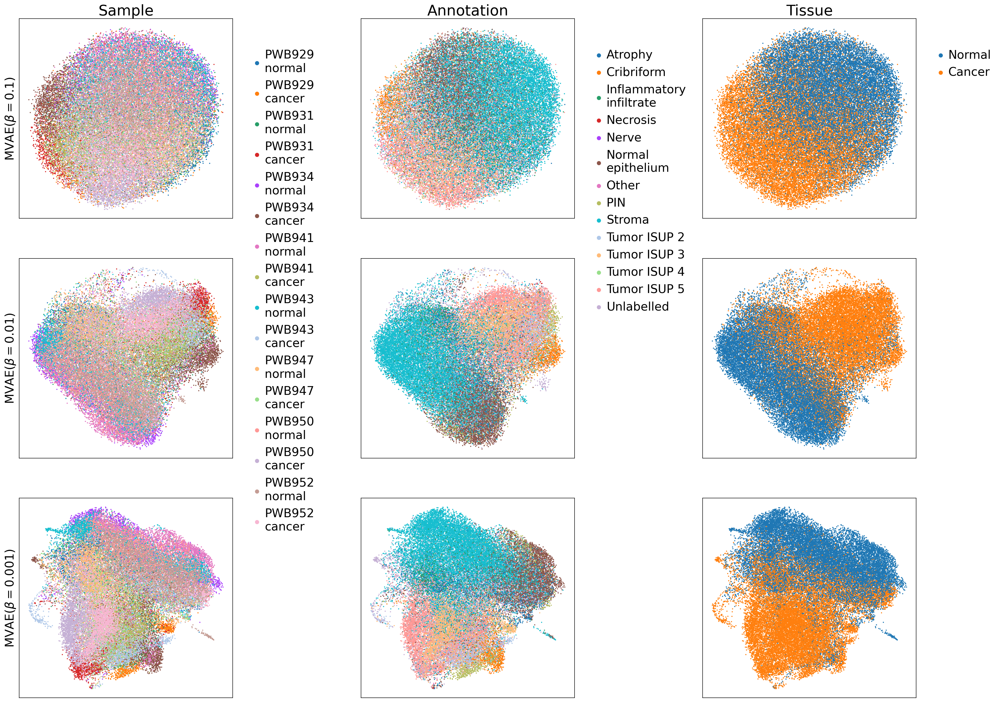

In [13]:
row_num = 3
col_num = 3
fig, axes = plt.subplots(row_num, col_num, figsize=[27, 21])
fig.subplots_adjust(wspace=0.6)
for i, m in enumerate(["mvae_beta0.1_gamma0_epoch100", "mvae_beta0.01_gamma0_epoch100", "mvae_beta0.001_gamma0_epoch100"]):
    if i != 0:
        sc.pl.embedding(mdata, f"X_{m}_z", ax=axes[i][0], color="sample_name", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata, f"X_{m}_z", ax=axes[i][1], color="cell_type", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata,  f"X_{m}_z",ax=axes[i][2], color="tissue_name", show=False, title="", size=15, legend_loc=None)
    else:
        sc.pl.embedding(mdata, f"X_{m}_z", ax=axes[i][0], color="sample_name", show=False, title="Sample", size=15)
        sc.pl.embedding(mdata, f"X_{m}_z", ax=axes[i][1], color="cell_type", show=False, title="Annotation", size=15)
        sc.pl.embedding(mdata,  f"X_{m}_z",ax=axes[i][2], color="tissue_name", show=False, title="Tissue", size=15)
        axes[i][0].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][1].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][2].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
            
    for j in range(col_num):
        axes[i][j].title.set_size(25)
        if j == 0:
            axes[i][j].set_ylabel(model_names[m], fontsize=20)
        else:
            axes[i][j].set_ylabel("", fontsize=20)
        axes[i][j].set_xlabel("")
            
plt.savefig("figures/shared_mvae_beta.png", bbox_inches="tight", pad_inches=0.5)

## Private change with beta

/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/

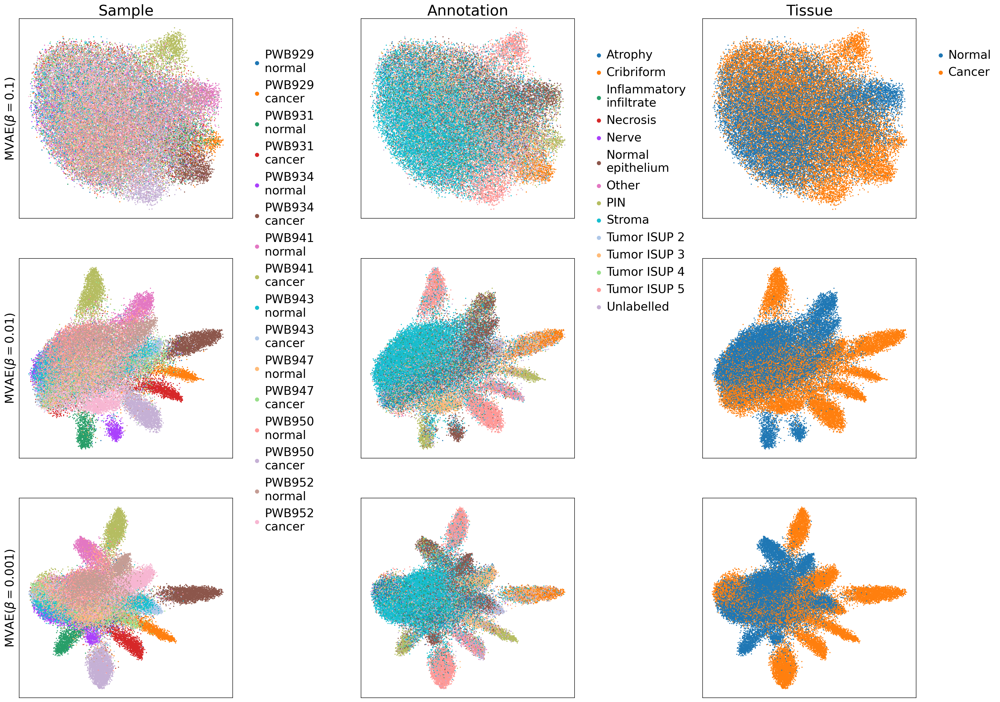

In [16]:
row_num = 3
col_num = 3
fig, axes = plt.subplots(row_num, col_num, figsize=[27, 21])
fig.subplots_adjust(wspace=0.6)
for i, m in enumerate(["mvae_beta0.1_gamma0_epoch100", "mvae_beta0.01_gamma0_epoch100", "mvae_beta0.001_gamma0_epoch100"]):
    if i != 0:
        sc.pl.embedding(mdata, f"X_{m}_z1_p", ax=axes[i][0], color="sample_name", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata, f"X_{m}_z1_p", ax=axes[i][1], color="cell_type", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata,  f"X_{m}_z1_p",ax=axes[i][2], color="tissue_name", show=False, title="", size=15, legend_loc=None)
    else:
        sc.pl.embedding(mdata, f"X_{m}_z1_p", ax=axes[i][0], color="sample_name", show=False, title="Sample", size=15)
        sc.pl.embedding(mdata, f"X_{m}_z1_p", ax=axes[i][1], color="cell_type", show=False, title="Annotation", size=15)
        sc.pl.embedding(mdata,  f"X_{m}_z1_p",ax=axes[i][2], color="tissue_name", show=False, title="Tissue", size=15)
        axes[i][0].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][1].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][2].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
            
    for j in range(col_num):
        axes[i][j].title.set_size(25)
        if j == 0:
            axes[i][j].set_ylabel(model_names[m], fontsize=20)
        else:
            axes[i][j].set_ylabel("", fontsize=20)
        axes[i][j].set_xlabel("")
            
plt.savefig("figures/private_rna_mvae_beta.png", bbox_inches="tight", pad_inches=0.5)

/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/

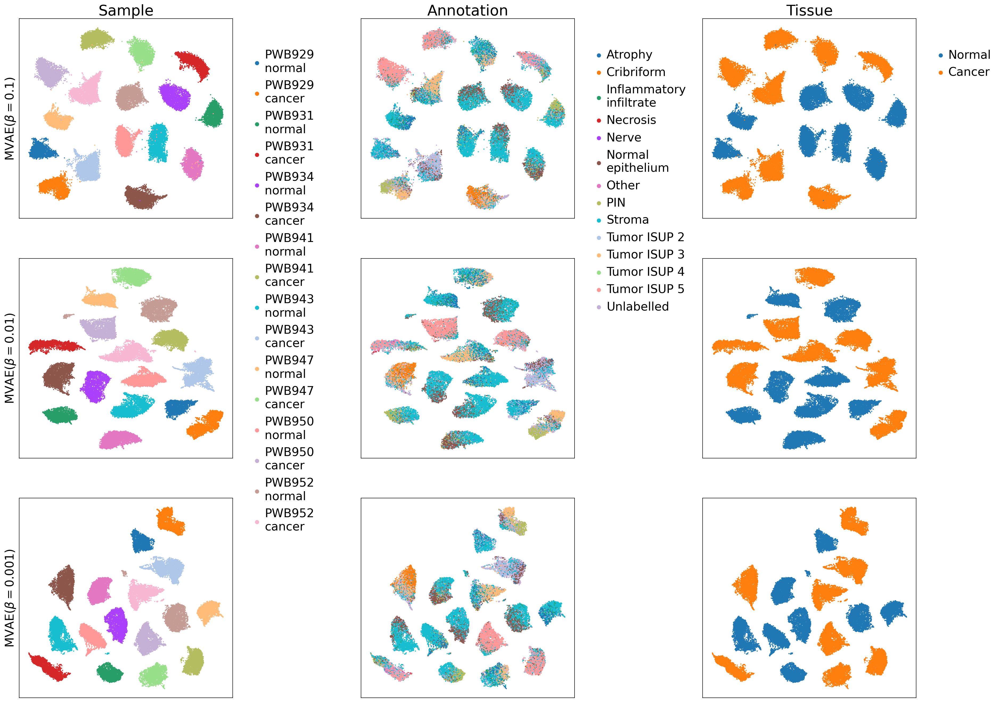

In [15]:
row_num = 3
col_num = 3
fig, axes = plt.subplots(row_num, col_num, figsize=[27, 21])
fig.subplots_adjust(wspace=0.6)
for i, m in enumerate(["mvae_beta0.1_gamma0_epoch100", "mvae_beta0.01_gamma0_epoch100", "mvae_beta0.001_gamma0_epoch100"]):
    if i != 0:
        sc.pl.embedding(mdata, f"X_{m}_z2_p", ax=axes[i][0], color="sample_name", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata, f"X_{m}_z2_p", ax=axes[i][1], color="cell_type", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata,  f"X_{m}_z2_p",ax=axes[i][2], color="tissue_name", show=False, title="", size=15, legend_loc=None)
    else:
        sc.pl.embedding(mdata, f"X_{m}_z2_p", ax=axes[i][0], color="sample_name", show=False, title="Sample", size=15)
        sc.pl.embedding(mdata, f"X_{m}_z2_p", ax=axes[i][1], color="cell_type", show=False, title="Annotation", size=15)
        sc.pl.embedding(mdata,  f"X_{m}_z2_p",ax=axes[i][2], color="tissue_name", show=False, title="Tissue", size=15)
        axes[i][0].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][1].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][2].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
            
    for j in range(col_num):
        axes[i][j].title.set_size(25)
        if j == 0:
            axes[i][j].set_ylabel(model_names[m], fontsize=20)
        else:
            axes[i][j].set_ylabel("", fontsize=20)
        axes[i][j].set_xlabel("")
            
plt.savefig("figures/private_msi_mvae_beta.png", bbox_inches="tight", pad_inches=0.5)

In [ ]:
row_num = 3
col_num = 3
fig, axes = plt.subplots(row_num, col_num, figsize=[27, 21])
fig.subplots_adjust(wspace=0.6)
for i, m in enumerate(["mvae_beta0.1_gamma0_epoch100", "mvae_beta0.01_gamma0_epoch100", "mvae_beta0.001_gamma0_epoch100"]):
    if i != 0:
        sc.pl.embedding(mdata, f"X_{m}_z1_mod", ax=axes[i][0], color="sample_name", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata, f"X_{m}_z1_mod", ax=axes[i][1], color="cell_type", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata,  f"X_{m}_z1_mod",ax=axes[i][2], color="tissue_name", show=False, title="", size=15, legend_loc=None)
    else:
        sc.pl.embedding(mdata, f"X_{m}_z1_mod", ax=axes[i][0], color="sample_name", show=False, title="Sample", size=15)
        sc.pl.embedding(mdata, f"X_{m}_z1_mod", ax=axes[i][1], color="cell_type", show=False, title="Annotation", size=15)
        sc.pl.embedding(mdata,  f"X_{m}_z1_mod",ax=axes[i][2], color="tissue_name", show=False, title="Tissue", size=15)
        axes[i][0].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][1].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][2].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
            
    for j in range(col_num):
        axes[i][j].title.set_size(25)
        if j == 0:
            axes[i][j].set_ylabel(model_names[m], fontsize=20)
        else:
            axes[i][j].set_ylabel("", fontsize=20)
        axes[i][j].set_xlabel("")
            
plt.savefig("figures/mod_rna_mvae_beta.png", bbox_inches="tight", pad_inches=0.5)

In [ ]:
row_num = 3
col_num = 3
fig, axes = plt.subplots(row_num, col_num, figsize=[27, 21])
fig.subplots_adjust(wspace=0.6)
for i, m in enumerate(["mvae_beta0.1_gamma0_epoch100", "mvae_beta0.01_gamma0_epoch100", "mvae_beta0.001_gamma0_epoch100"]):
    if i != 0:
        sc.pl.embedding(mdata, f"X_{m}_z2_mod", ax=axes[i][0], color="sample_name", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata, f"X_{m}_z2_mod", ax=axes[i][1], color="cell_type", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata,  f"X_{m}_z2_mod",ax=axes[i][2], color="tissue_name", show=False, title="", size=15, legend_loc=None)
    else:
        sc.pl.embedding(mdata, f"X_{m}_z2_mod", ax=axes[i][0], color="sample_name", show=False, title="Sample", size=15)
        sc.pl.embedding(mdata, f"X_{m}_z2_mod", ax=axes[i][1], color="cell_type", show=False, title="Annotation", size=15)
        sc.pl.embedding(mdata,  f"X_{m}_z2_mod",ax=axes[i][2], color="tissue_name", show=False, title="Tissue", size=15)
        axes[i][0].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][1].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][2].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
            
    for j in range(col_num):
        axes[i][j].title.set_size(25)
        if j == 0:
            axes[i][j].set_ylabel(model_names[m], fontsize=20)
        else:
            axes[i][j].set_ylabel("", fontsize=20)
        axes[i][j].set_xlabel("")
            
plt.savefig("figures/mod_msi_mvae_beta.png", bbox_inches="tight", pad_inches=0.5)

In [ ]:
row_num = 3
col_num = 3
fig, axes = plt.subplots(row_num, col_num, figsize=[27, 21])
fig.subplots_adjust(wspace=0.6)
for i, m in enumerate(["mvae_beta0.1_gamma0_epoch100", "mvae_beta0.01_gamma0_epoch100", "mvae_beta0.001_gamma0_epoch100"]):
    if i != 0:
        sc.pl.embedding(mdata, f"X_{m}_z2_batch_free", ax=axes[i][0], color="sample_name", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata, f"X_{m}_z2_batch_free", ax=axes[i][1], color="cell_type", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata,  f"X_{m}_z2_batch_free",ax=axes[i][2], color="tissue_name", show=False, title="", size=15, legend_loc=None)
    else:
        sc.pl.embedding(mdata, f"X_{m}_z2_batch_free", ax=axes[i][0], color="sample_name", show=False, title="Sample", size=15)
        sc.pl.embedding(mdata, f"X_{m}_z2_batch_free", ax=axes[i][1], color="cell_type", show=False, title="Annotation", size=15)
        sc.pl.embedding(mdata,  f"X_{m}_z2_batch_free",ax=axes[i][2], color="tissue_name", show=False, title="Tissue", size=15)
        axes[i][0].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][1].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][2].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
            
    for j in range(col_num):
        axes[i][j].title.set_size(25)
        if j == 0:
            axes[i][j].set_ylabel(model_names[m], fontsize=20)
        else:
            axes[i][j].set_ylabel("", fontsize=20)
        axes[i][j].set_xlabel("")
            
plt.savefig("figures/batch_free_msi_mvae_beta.png", bbox_inches="tight", pad_inches=0.5)

## Shared change with gamma

In [ ]:
row_num = 4
col_num = 3
fig, axes = plt.subplots(row_num, col_num, figsize=[27, 21])
fig.subplots_adjust(wspace=0.6)
for i, m in enumerate(["mvae_beta0.001_gamma0_epoch100", "mvae_beta0.001_gamma0.0001_epoch100", "mvae_beta0.001_gamma0.0003_epoch100", "mvae_beta0.001_gamma0.0005_epoch100"]):
    if i != 0:
        sc.pl.embedding(mdata, f"X_{m}_z", ax=axes[i][0], color="sample_name", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata, f"X_{m}_z", ax=axes[i][1], color="cell_type", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata,  f"X_{m}_z",ax=axes[i][2], color="tissue_name", show=False, title="", size=15, legend_loc=None)
    else:
        sc.pl.embedding(mdata, f"X_{m}_z", ax=axes[i][0], color="sample_name", show=False, title="Sample", size=15)
        sc.pl.embedding(mdata, f"X_{m}_z", ax=axes[i][1], color="cell_type", show=False, title="Annotation", size=15)
        sc.pl.embedding(mdata,  f"X_{m}_z",ax=axes[i][2], color="tissue_name", show=False, title="Tissue", size=15)
        axes[i][0].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][1].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][2].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
            
    for j in range(col_num):
        axes[i][j].title.set_size(25)
        if j == 0:
            axes[i][j].set_ylabel(model_names[m], fontsize=20)
        else:
            axes[i][j].set_ylabel("", fontsize=20)
        axes[i][j].set_xlabel("")
            
plt.savefig("figures/shared_mvae_gamma.png", bbox_inches="tight", pad_inches=0.5)

## Private change with gamma

In [ ]:
row_num = 4
col_num = 3
fig, axes = plt.subplots(row_num, col_num, figsize=[27, 21])
fig.subplots_adjust(wspace=0.6)
for i, m in enumerate(["mvae_beta0.001_gamma0_epoch100", "mvae_beta0.001_gamma0.0001_epoch100", "mvae_beta0.001_gamma0.0003_epoch100", "mvae_beta0.001_gamma0.0005_epoch100"]):
    if i != 0:
        sc.pl.embedding(mdata, f"X_{m}_z2_mod", ax=axes[i][0], color="sample_name", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata, f"X_{m}_z2_mod", ax=axes[i][1], color="cell_type", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata,  f"X_{m}_z2_mod",ax=axes[i][2], color="tissue_name", show=False, title="", size=15, legend_loc=None)
    else:
        sc.pl.embedding(mdata, f"X_{m}_z2_mod", ax=axes[i][0], color="sample_name", show=False, title="Sample", size=15)
        sc.pl.embedding(mdata, f"X_{m}_z2_mod", ax=axes[i][1], color="cell_type", show=False, title="Annotation", size=15)
        sc.pl.embedding(mdata,  f"X_{m}_z2_mod",ax=axes[i][2], color="tissue_name", show=False, title="Tissue", size=15)
        axes[i][0].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][1].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][2].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
            
    for j in range(col_num):
        axes[i][j].title.set_size(25)
        if j == 0:
            axes[i][j].set_ylabel(model_names[m], fontsize=20)
        else:
            axes[i][j].set_ylabel("", fontsize=20)
        axes[i][j].set_xlabel("")
            
plt.savefig("figures/mod_msi_mvae_gamma.png", bbox_inches="tight", pad_inches=0.5)

In [ ]:
row_num = 4
col_num = 3
fig, axes = plt.subplots(row_num, col_num, figsize=[27, 21])
fig.subplots_adjust(wspace=0.6)
for i, m in enumerate(["mvae_beta0.001_gamma0_epoch100", "mvae_beta0.001_gamma0.0001_epoch100", "mvae_beta0.001_gamma0.0003_epoch100", "mvae_beta0.001_gamma0.0005_epoch100"]):
    if i != 0:
        sc.pl.embedding(mdata, f"X_{m}_z1_mod", ax=axes[i][0], color="sample_name", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata, f"X_{m}_z1_mod", ax=axes[i][1], color="cell_type", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata,  f"X_{m}_z1_mod",ax=axes[i][2], color="tissue_name", show=False, title="", size=15, legend_loc=None)
    else:
        sc.pl.embedding(mdata, f"X_{m}_z1_mod", ax=axes[i][0], color="sample_name", show=False, title="Sample", size=15)
        sc.pl.embedding(mdata, f"X_{m}_z1_mod", ax=axes[i][1], color="cell_type", show=False, title="Annotation", size=15)
        sc.pl.embedding(mdata,  f"X_{m}_z1_mod",ax=axes[i][2], color="tissue_name", show=False, title="Tissue", size=15)
        axes[i][0].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][1].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][2].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
            
    for j in range(col_num):
        axes[i][j].title.set_size(25)
        if j == 0:
            axes[i][j].set_ylabel(model_names[m], fontsize=20)
        else:
            axes[i][j].set_ylabel("", fontsize=20)
        axes[i][j].set_xlabel("")
            
plt.savefig("figures/mod_rna_mvae_gamma.png", bbox_inches="tight", pad_inches=0.5)

In [ ]:
row_num = 4
col_num = 3
fig, axes = plt.subplots(row_num, col_num, figsize=[27, 21])
fig.subplots_adjust(wspace=0.6)
for i, m in enumerate(["mvae_beta0.001_gamma0_epoch100", "mvae_beta0.001_gamma0.0001_epoch100", "mvae_beta0.001_gamma0.0003_epoch100", "mvae_beta0.001_gamma0.0005_epoch100"]):
    if i != 0:
        sc.pl.embedding(mdata, f"X_{m}_z1_p", ax=axes[i][0], color="sample_name", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata, f"X_{m}_z1_p", ax=axes[i][1], color="cell_type", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata,  f"X_{m}_z1_p",ax=axes[i][2], color="tissue_name", show=False, title="", size=15, legend_loc=None)
    else:
        sc.pl.embedding(mdata, f"X_{m}_z1_p", ax=axes[i][0], color="sample_name", show=False, title="Sample", size=15)
        sc.pl.embedding(mdata, f"X_{m}_z1_p", ax=axes[i][1], color="cell_type", show=False, title="Annotation", size=15)
        sc.pl.embedding(mdata,  f"X_{m}_z1_p",ax=axes[i][2], color="tissue_name", show=False, title="Tissue", size=15)
        axes[i][0].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][1].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][2].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.35, 0.9), frameon=False, alignment='center')
            
    for j in range(col_num):
        axes[i][j].title.set_size(25)
        if j == 0:
            axes[i][j].set_ylabel(model_names[m], fontsize=18)
        else:
            axes[i][j].set_ylabel("")
        axes[i][j].set_xlabel("")
            
plt.savefig("figures/priv_rna_mvae_gamma.png", bbox_inches="tight", pad_inches=0.5)

In [ ]:
row_num = 4
col_num = 3
fig, axes = plt.subplots(row_num, col_num, figsize=[27, 21])
fig.subplots_adjust(wspace=0.6)
for i, m in enumerate(["mvae_beta0.001_gamma0_epoch100", "mvae_beta0.001_gamma0.0001_epoch100", "mvae_beta0.001_gamma0.0003_epoch100", "mvae_beta0.001_gamma0.0005_epoch100"]):
    if i != 0:
        sc.pl.embedding(mdata, f"X_{m}_z2_batch_free", ax=axes[i][0], color="sample_name", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata, f"X_{m}_z2_batch_free", ax=axes[i][1], color="cell_type", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata,  f"X_{m}_z2_batch_free",ax=axes[i][2], color="tissue_name", show=False, title="", size=15, legend_loc=None)
    else:
        sc.pl.embedding(mdata, f"X_{m}_z2_batch_free", ax=axes[i][0], color="sample_name", show=False, title="Sample", size=15)
        sc.pl.embedding(mdata, f"X_{m}_z2_batch_free", ax=axes[i][1], color="cell_type", show=False, title="Annotation", size=15)
        sc.pl.embedding(mdata,  f"X_{m}_z2_batch_free",ax=axes[i][2], color="tissue_name", show=False, title="Tissue", size=15)
        axes[i][0].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][1].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][2].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
            
    for j in range(col_num):
        axes[i][j].title.set_size(25)
        if j == 0:
            axes[i][j].set_ylabel(model_names[m], fontsize=20)
        else:
            axes[i][j].set_ylabel("", fontsize=20)
        axes[i][j].set_xlabel("")
            
plt.savefig("figures/mod_msi_mvae_gamma.png", bbox_inches="tight", pad_inches=0.5)

## shared change with delta

In [ ]:
row_num = 3
col_num = 3
fig, axes = plt.subplots(row_num, col_num, figsize=[27, 21])
fig.subplots_adjust(wspace=0.6)
for i, m in enumerate(["mvae_beta0.001_gamma0.0001", "mvae_beta0.001_gamma0.0001_delta0.1", "mvae_beta0.001_gamma0.0001_delta1.0"]):
    if i != 0:
        sc.pl.embedding(mdata, f"X_{m}_z", ax=axes[i][0], color="sample_name", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata, f"X_{m}_z", ax=axes[i][1], color="cell_type", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata,  f"X_{m}_z",ax=axes[i][2], color="tissue_name", show=False, title="", size=15, legend_loc=None)
    else:
        sc.pl.embedding(mdata, f"X_{m}_z", ax=axes[i][0], color="sample_name", show=False, title="Sample", size=15)
        sc.pl.embedding(mdata, f"X_{m}_z", ax=axes[i][1], color="cell_type", show=False, title="Annotation", size=15)
        sc.pl.embedding(mdata,  f"X_{m}_z",ax=axes[i][2], color="tissue_name", show=False, title="Tissue", size=15)
        axes[i][0].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][1].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][2].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
            
    for j in range(col_num):
        axes[i][j].title.set_size(25)
        if j == 0:
            axes[i][j].set_ylabel(model_names[m], fontsize=18)
        else:
            axes[i][j].set_ylabel("", fontsize=18)
        axes[i][j].set_xlabel("")
            
plt.savefig("figures/shared_mvae_delta.png", bbox_inches="tight", pad_inches=0.5)

In [ ]:
row_num = 3
col_num = 3
fig, axes = plt.subplots(row_num, col_num, figsize=[27, 21])
fig.subplots_adjust(wspace=0.6)
for i, m in enumerate(["mvae_beta0.001_gamma0.0001", "mvae_beta0.001_gamma0.0001_delta0.1", "mvae_beta0.001_gamma0.0001_delta1.0"]):
    if i != 0:
        sc.pl.embedding(mdata, f"X_{m}_z1_p", ax=axes[i][0], color="sample_name", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata, f"X_{m}_z1_p", ax=axes[i][1], color="cell_type", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata,  f"X_{m}_z1_p",ax=axes[i][2], color="tissue_name", show=False, title="", size=15, legend_loc=None)
    else:
        sc.pl.embedding(mdata, f"X_{m}_z1_p", ax=axes[i][0], color="sample_name", show=False, title="Sample", size=15)
        sc.pl.embedding(mdata, f"X_{m}_z1_p", ax=axes[i][1], color="cell_type", show=False, title="Annotation", size=15)
        sc.pl.embedding(mdata,  f"X_{m}_z1_p",ax=axes[i][2], color="tissue_name", show=False, title="Tissue", size=15)
        axes[i][0].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][1].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][2].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.35, 0.9), frameon=False, alignment='center')
            
    for j in range(col_num):
        axes[i][j].title.set_size(25)
        if j == 0:
            axes[i][j].set_ylabel(model_names[m], fontsize=18)
        else:
            axes[i][j].set_ylabel("", fontsize=18)
        axes[i][j].set_xlabel("")
            
plt.savefig("figures/private_rna_mvae_delta.png", bbox_inches="tight", pad_inches=0.5)

In [ ]:
row_num = 3
col_num = 3
fig, axes = plt.subplots(row_num, col_num, figsize=[27, 21])
fig.subplots_adjust(wspace=0.6)
for i, m in enumerate(["mvae_beta0.001_gamma0.0001", "mvae_beta0.001_gamma0.0001_delta0.1", "mvae_beta0.001_gamma0.0001_delta1.0"]):
    if i != 0:
        sc.pl.embedding(mdata, f"X_{m}_z2_mod", ax=axes[i][0], color="sample_name", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata, f"X_{m}_z2_mod", ax=axes[i][1], color="cell_type", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata,  f"X_{m}_z2_mod",ax=axes[i][2], color="tissue_name", show=False, title="", size=15, legend_loc=None)
    else:
        sc.pl.embedding(mdata, f"X_{m}_z2_mod", ax=axes[i][0], color="sample_name", show=False, title="Sample", size=15)
        sc.pl.embedding(mdata, f"X_{m}_z2_mod", ax=axes[i][1], color="cell_type", show=False, title="Annotation", size=15)
        sc.pl.embedding(mdata,  f"X_{m}_z2_mod",ax=axes[i][2], color="tissue_name", show=False, title="Tissue", size=15)
        axes[i][0].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][1].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][2].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.35, 0.9), frameon=False, alignment='center')
            
    for j in range(col_num):
        axes[i][j].title.set_size(25)
        if j == 0:
            axes[i][j].set_ylabel(model_names[m], fontsize=18)
        else:
            axes[i][j].set_ylabel("", fontsize=18)
        axes[i][j].set_xlabel("")
            
plt.savefig("figures/mod_msi_mvae_delta.png", bbox_inches="tight", pad_inches=0.5)

In [ ]:
row_num = 3
col_num = 3
fig, axes = plt.subplots(row_num, col_num, figsize=[27, 21])
fig.subplots_adjust(wspace=0.6)
for i, m in enumerate(["mvae_beta0.001_gamma0.0001", "mvae_beta0.001_gamma0.0001_delta0.1", "mvae_beta0.001_gamma0.0001_delta1.0"]):
    if i != 0:
        sc.pl.embedding(mdata, f"X_{m}_z2_batch_free", ax=axes[i][0], color="sample_name", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata, f"X_{m}_z2_batch_free", ax=axes[i][1], color="cell_type", show=False, title="", size=15, legend_loc=None)
        sc.pl.embedding(mdata,  f"X_{m}_z2_batch_free",ax=axes[i][2], color="tissue_name", show=False, title="", size=15, legend_loc=None)
    else:
        sc.pl.embedding(mdata, f"X_{m}_z2_batch_free", ax=axes[i][0], color="sample_name", show=False, title="Sample", size=15)
        sc.pl.embedding(mdata, f"X_{m}_z2_batch_free", ax=axes[i][1], color="cell_type", show=False, title="Annotation", size=15)
        sc.pl.embedding(mdata,  f"X_{m}_z2_batch_free",ax=axes[i][2], color="tissue_name", show=False, title="Tissue", size=15)
        axes[i][0].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][1].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.05, 0.9), frameon=False, alignment='center')
        axes[i][2].legend(ncol=1, fontsize=20, bbox_to_anchor=(1.35, 0.9), frameon=False, alignment='center')
            
    for j in range(col_num):
        axes[i][j].title.set_size(25)
        if j == 0:
            axes[i][j].set_ylabel(model_names[m], fontsize=18)
        else:
            axes[i][j].set_ylabel("", fontsize=18)
        axes[i][j].set_xlabel("")
            
plt.savefig("figures/batch_free_msi_mvae_delta.png", bbox_inches="tight", pad_inches=0.5)

## Logs

In [58]:
from src.utils import get_loss_logs, make_plot

### Change with beta

In [58]:
model = models["mvae_beta0.1_gamma0_epoch100"]
runlog_data1 = get_loss_logs(model, mvae=True)
model = models["mvae_beta0.01_gamma0_epoch100"]
runlog_data2 = get_loss_logs(model, mvae=True)
model = models["mvae_beta0.001_gamma0_epoch100"]
runlog_data3 = get_loss_logs(model, mvae=True)

In [60]:
runlog_data1["model"] = "MVAE(beta=0.1)"
runlog_data2["model"] = "MVAE(beta=0.01)"
runlog_data3["model"] = "MVAE(beta=0.001)"
c = ["PoE_training/total_loss", "PoE_training/kl", "PoE_training/kl_rna_p", "PoE_training/kl_rna_s", 
        "PoE_training/kl_msi_p", "PoE_training/kl_msi_s", "PoE_training/kl_rna_mod", "PoE_training/kl_msi_mod"]
rd1 = runlog_data1.loc[:,["step","model", *c[1:]]]
rd2 = runlog_data2.loc[:, ["step", "model", *c]]
rd3 = runlog_data3.loc[:, ["step", "model", *c]]
data = pd.concat([rd1,rd2, rd3], ignore_index=True)
data["model"] = data["model"].astype("category")
data = data[data["step"] < 10e3]

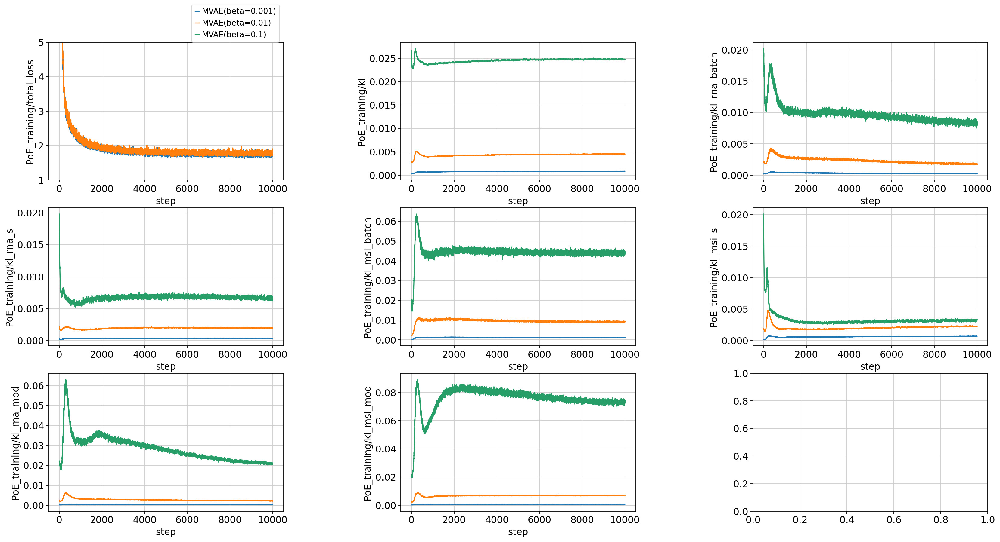

In [62]:
import matplotlib.pyplot as plt
import seaborn as sns
row = 3
cols = 3
fig, axes = plt.subplots(row, cols, figsize=(25, 15))
fig.subplots_adjust(wspace=0.5, top=0.8)


for i, col in enumerate(c):
    if i == 0:
        sns.lineplot(ax=axes[int(i / cols)][i % cols], data=data, x="step", y=col, hue="model")
        axes[0][0].legend(ncol=1, fontsize="small", bbox_to_anchor=(1, 1.3))
        axes[0][0].set(ylim=(1.0, 5.0))
    else:
        sns.lineplot(ax=axes[int(i / cols)][i % cols], data=data, x="step", y=col, hue="model", legend=False)
        
    if "_p" in col:
        axes[int(i / cols)][i % cols].set(ylabel=col.replace("_p", "_batch"))


### Change with gamma

In [60]:
import string

In [57]:
model = models["mvae_beta0.001_gamma0_epoch100"]
runlog_data1 = get_loss_logs(model, mvae=True)
model = models["mvae_beta0.001_gamma0.0001_epoch100"]
runlog_data2 = get_loss_logs(model, mvae=True)
model = models["mvae_beta0.001_gamma0.0005_epoch100"]
runlog_data3 = get_loss_logs(model, mvae=True)

In [58]:
runlog_data1["model"] = "MVAE(beta=0.001, gamma=0)"
runlog_data2["model"] = "MVAE(beta=0.001, gamma=0.0001)"
runlog_data3["model"] = "MVAE(beta=0.001, gamma=0.0005)"
runlog_data1["PoE_training/batch_integration"] = [None] * len(runlog_data1)
c = ["PoE_training/total_loss", "PoE_training/kl", "PoE_training/kl_rna_p", "PoE_training/kl_rna_s", 
        "PoE_training/kl_msi_p", "PoE_training/kl_msi_s", "PoE_training/kl_rna_mod", "PoE_training/kl_msi_mod", "PoE_training/batch_integration"]
rd1 = runlog_data1.loc[:,["step","model", *c[:-1]]]
rd2 = runlog_data2.loc[:, ["step", "model", *c]]
rd3 = runlog_data3.loc[:, ["step", "model", *c]]
data = pd.concat([rd1,rd2, rd3], ignore_index=True)
data["model"] = data["model"].astype("category")
# data = data[data["step"] < 10e3]

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
row = 3
cols = 3
fig, axes = plt.subplots(row, cols, figsize=(25, 15))
fig.subplots_adjust(wspace=0.6, hspace=0.25, top=1.1)

for i, col in enumerate(c):
    if i == 0:
        sns.lineplot(ax=axes[int(i / cols)][i % cols], data=data, x="step", y=col, hue="model")
        axes[0][0].legend(ncol=1, fontsize="small", bbox_to_anchor=(1, 1.3))
    else:
        sns.lineplot(ax=axes[int(i / cols)][i % cols], data=data, x="step", y=col, hue="model", legend=False)
        
    if "_p" in col:
        axes[int(i / cols)][i % cols].set(ylabel=col.replace("_p", "_batch"))
        

        fig.subplots_adjust(wspace=0.6, hspace=0.25, top=1.1)
    axes[int(i / cols)][i % cols].title.set_text(string.ascii_uppercase[i])


### Change with delta

In [62]:
keys = {
    "mvae_beta0.001_gamma0.0001_epoch100": "MVAE(beta=0.001, gamma=0.0001, delta=0)",
    "mvae_beta0.001_gamma0.0001_delta0.1": "MVAE(beta=0.001, gamma=0.0001, delta=0.1)",
    "mvae_beta0.001_gamma0.0001_delta1.0": "MVAE(beta=0.001, gamma=0.0001, delta=1.0)"
}
datas = {}
for key in keys:
    datas[key] = get_loss_logs(models[key], mvae=True)
    datas[key]["model"] = keys[key]

In [63]:
c = ["PoE_training/total_loss", "PoE_training/kl", "PoE_training/kl_rna_p", "PoE_training/kl_rna_s", 
        "PoE_training/kl_rna_mod", "PoE_training/kl_msi_p", "PoE_training/kl_msi_s", "PoE_training/kl_msi_mod", 
     "PoE_training/batch_integration_rna", "PoE_training/batch_integration_msi", 
     "PoE_training/batch_integration", "PoE_training/batch_loss"]

rds = []
for key in keys:
    if "delta" not in key:
        rds.append(datas[key].loc[:,["step","model", *c[:-4], *c[-2:]]])
    else:
        rds.append(datas[key].loc[:, ["step", "model", *c]])

data = pd.concat(rds, ignore_index=True)
data["PoE_training/batch_integration"] = data["PoE_training/batch_loss"] * 0.0001
data["model"] = data["model"].astype("category")
data = data[data["step"] < 10000]

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
row = 3
cols = 4
fig, axes = plt.subplots(row, cols, figsize=(30, 15))
fig.subplots_adjust(wspace=0.6, hspace=0.25, top=1.1)
fig.delaxes(axes[2][3])

for i, col in enumerate(c[:-1]):
    if i == 0:
        sns.lineplot(ax=axes[int(i / cols)][i % cols], data=data, x="step", y=col, hue="model")
        axes[0][0].legend(ncol=1, fontsize="small", bbox_to_anchor=(1, 1.3))
    else:
        sns.lineplot(ax=axes[int(i / cols)][i % cols], data=data, x="step", y=col, hue="model", legend=False)
        
    if "integration_" in col:
        axes[int(i / cols)][i % cols].set(ylabel=col.replace("integration_", "separation_"))
    if "_p" in col:
        axes[int(i / cols)][i % cols].set(ylabel=col.replace("_p", "_batch"))
    axes[int(i / cols)][i % cols].title.set_text(string.ascii_uppercase[i])
        

## Classification

In [62]:
from src.smvae.diagnostics import classification_performance
from tqdm import tqdm

perf_df = pd.read_csv("classification/mvae")
# perf_df = pd.DataFrame(index=mdata.obs["sample"].unique(), columns=models.keys())

# for m in models.keys():
#     for sample in tqdm(mdata.obs["sample"].unique()):
#         perf_df.loc[sample, m] = classification_performance(mdata, label_key="new_ann", embed_key=f"X_{m}_z", loo=sample)[0]

# perf_df.to_csv("classification/mvae")

100%|███████████████████████████████████████████| 16/16 [01:23<00:00,  5.22s/it]


In [63]:
perf_df.mean()

/tmp/ipykernel_637519/3976431540.py:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  perf_df.mean()


mvae_beta0.1_gamma0_epoch100                 0.322886
mvae_beta0.01_gamma0_epoch100                0.383786
mvae_beta0.01_gamma0_epoch100_noklonbatch    0.378782
mvae_beta0.001_gamma0_epoch100               0.396511
mvae_beta0.01_gamma0.0001_epoch100           0.372371
mvae_beta0.001_gamma0.0001                   0.389763
mvae_beta0.001_gamma0.0003                   0.380972
mvae_beta0.001_gamma0.0005                   0.356876
mvae_beta0.001_gamma0.01                     0.387433
mvae_beta0.001_gamma0.0001_delta0.1          0.383965
mvae_beta0.001_gamma0.0001_delta1.0          0.380252
mvae_beta0.001_gamma0.0003_delta0.1          0.379846
mvae_beta0.0001_gamma0.0003                  0.375405
mvae_beta0.01_betap_0.001_gamma0             0.379908
mvae_beta0.001_gamma0.0001_epoch100          0.393832
mvae_beta0.001_gamma0.0003_epoch100          0.378539
mvae_beta0.001_gamma0.0005_epoch100          0.352058
dtype: float64

In [64]:
# classification z2 batch free
perf_df = pd.read_csv("classification/mvae_msi_batch_free")
# perf_df = pd.DataFrame(index=mdata.obs["sample"].unique(), columns=models.keys())

m = "mvae_beta0.001_gamma0.0005_epoch100"
for m in models.keys():
    for sample in tqdm(mdata.obs["sample"].unique()):
    perf_df.loc[sample, m] = classification_performance(mdata, label_key="new_ann", embed_key=f"X_{m}_z2_batch_free", loo=sample)[0]

perf_df.to_csv("classification/mvae_msi_batch_free")

100%|███████████████████████████████████████████| 16/16 [01:19<00:00,  4.94s/it]


In [43]:
perf_df.mean()

/tmp/ipykernel_637519/3976431540.py:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  perf_df.mean()


mvae_beta0.1_gamma0_epoch100           0.321211
mvae_beta0.01_gamma0_epoch100          0.364346
mvae_beta0.001_gamma0_epoch100         0.353319
mvae_beta0.01_betap_0.001_gamma0       0.362401
mvae_beta0.001_gamma0.0001             0.337850
mvae_beta0.001_gamma0.0003             0.340145
mvae_beta0.001_gamma0.0005             0.330502
mvae_beta0.001_gamma0.0001_delta0.1    0.334555
mvae_beta0.001_gamma0.0001_delta1.0    0.344950
mvae_beta0.0001_gamma0.0003            0.330482
mvae_beta0.001_gamma0.0001_epoch100    0.357671
mvae_beta0.001_gamma0.0003_epoch100    0.351961
dtype: float64

## kBET

In [52]:
from src.loss import calc_kBET
# kbet = {}
# for m in models.keys():
#     kbet[m] = calc_kBET(mdata, "sample", m)
# kbet
# a = pd.DataFrame(kbet, index=["stat_mean", "pvalue_mean", "accept_rate"]).T
# a.to_csv("classification/kbet_mvae")
a = pd.read_csv("classification/kbet_mvae", index_col="Unnamed: 0")

In [39]:
a = pd.read_csv("classification/kbet_batch_free", index_col="Unnamed: 0")
droppable = ["PCA", "Harmony", 
        "scVI","X_vaeb"]
a = a[~a.model.isin(droppable)]
a

,stat_mean,pvalue_mean,accept_rate,model
X_mvae_beta0.1_gamma0_epoch100_z2_batch_free,279.612740,0.000057,0.000353,X_mvae_beta0.1_gamma0_epoch100_z2_batch_free
X_mvae_beta0.001_gamma0.0001_delta0.1_z2_batch_free,206.412073,0.000201,0.000989,X_mvae_beta0.001_gamma0.0001_delta0.1_z2_batch...
X_mvae_beta0.001_gamma0.0001_z2_batch_free,183.701129,0.000142,0.000400,X_mvae_beta0.001_gamma0.0001_z2_batch_free
X_mvae_beta0.01_gamma0_epoch100_z2_batch_free,142.272718,0.000451,0.001789,X_mvae_beta0.01_gamma0_epoch100_z2_batch_free
X_mvae_beta0.001_gamma0.0001_delta1.0_z2_batch_free,134.612073,0.000414,0.002142,X_mvae_beta0.001_gamma0.0001_delta1.0_z2_batch...
X_mvae_beta0.001_gamma0_epoch100_z2_batch_free,121.398576,0.000762,0.003555,X_mvae_beta0.001_gamma0_epoch100_z2_batch_free
X_mvae_beta0.001_gamma0.0001_epoch100_z2_batch_free,101.380132,0.002249,0.011160,X_mvae_beta0.001_gamma0.0001_epoch100_z2_batch...
X_mvae_beta0.001_gamma0.0003_epoch100_z2_batch_free,94.957645,0.002819,0.012549,X_mvae_beta0.001_gamma0.0003_epoch100_z2_batch...
X_mvae_beta0.001_gamma0.0005_epoch100_z2_batch_free,86.829794,0.003150,0.014950,X_mvae_beta0.001_gamma0.0005_epoch100_z2_batch...


Text(0, 0.5, 'kBET')

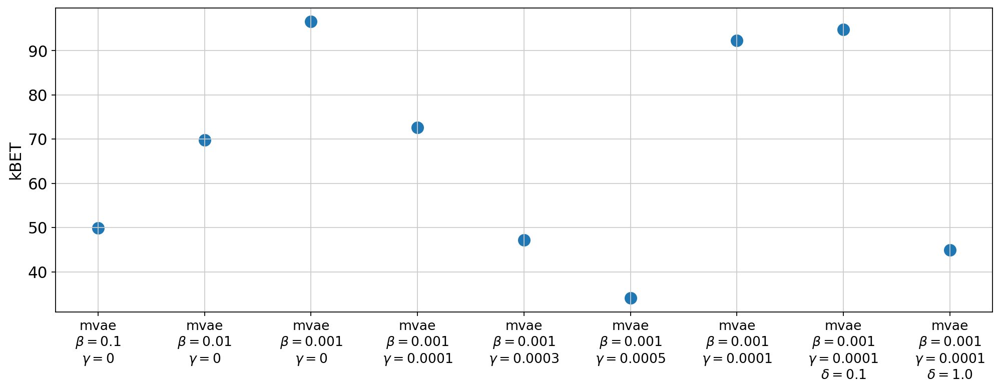

In [66]:
labels = [
    label.replace("X_mvae", "MVAE")
    .replace("z2_batch_free", "")
    .replace("_", "\n")
    .replace("beta", r"$\beta=$")
    .replace("gamma", r"$\gamma=$")
    .replace("delta", r"$\delta=$")
    .replace("epoch100", "")
    for label in a.model.values
]

fig = plt.figure(figsize=(15, 5))
ax = fig.add_subplot(1, 1, 1)
sns.scatterplot(data=a, x=labels, y="stat_mean", ax=ax, s=150)
ax.set_xticks(ticks=range(len(labels)), labels=labels, fontsize=12)
ax.set_ylabel("kBET")